# Final Project - Advanced Topics in Deep Learning, Part 2: Training Notebook


---
<br>

### Names and IDs:
Raz Diamond: 322281528
<br>
Ron Elyashar: 209350644
<br>
Liav Ermias: 211684956
<br>
Roeeii Itshayek: 212210751


# Introduction

### Import Libraries

In [ ]:
!pip install ipython-autotime
%load_ext autotime

import os

import random
import shutil
import time

import gdown
import kagglehub
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from IPython.display import display, Markdown
from PIL import Image
from keras import layers
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.preprocessing import image

time: 3.93 s (started: 2025-03-20 18:32:23 +00:00)


### Download and Display the README File

In [ ]:
file_id = '132g8ydTBKMFADh5XMEwdpNs2G90IF_RE'
gdown.download(f'https://drive.google.com/uc?export=download&id={file_id}', 'README.md', quiet=True)

with open('README.md', 'r') as file:
    explainer_content = file.read()

display(Markdown(explainer_content))

# **Advanced topics in Deep Learning Final Project**

By:\
**Raz Diamond (322281528)**, **Ron Elyashar (209350644)**,\
**Liav Ermias (211684956)** and **Roeeii Itshayek (212210751)**.

In this project, we were tasked with solving a **coloring** problem using methods we have learned over the semester. The
goal is to build a model capable of coloring images from
Kaggle's [20_UK_Garden_Birds](https://www.kaggle.com/datasets/davemahony/20-uk-garden-birds) dataset, which contains
**2,841 images** labeled across **20 classes**.

The assignment consists of two parts:

### **Pt. 1: Naive Image-to-Image Translation Deep Neural Network**

Three **naive DNN experiments** to solve the **coloring** problem.\
[🔗 Training Notebook (Part 1)](https://colab.research.google.com/drive/1tsFcOgRydmz39jILi01OOOYc0dqK1gfw?usp=sharing)\
[🔗 Testing Notebook (Part 1)](https://colab.research.google.com/drive/1uo53rHGtg1xbefcv1gLsO-dWiTX90TBj?usp=sharing)

### **Pt. 2: Image-to-Image Translation with Conditional Adversarial Networks**

Three **cGAN experiments** to solve the **coloring** problem. Inspired by a research paper from Berkeley.\
[🔗 Training Notebook (Part 2)](https://colab.research.google.com/drive/1HUJUY9YvVQKETTJ15odrARgyacliYpfl?usp=sharing)\
[🔗 Testing Notebook (Part 2)](https://colab.research.google.com/drive/1WfIW1RzE31Da0yKr0cYtFnKV_jaWskeV?usp=sharing)

We used the Python programming language, along with TensorFlow, Numpy, and Scikit-Learn. The notebooks were presented
using the Google Colab platform

## Structure of Colab Notebooks:

Each training notebook is divided into 4 sections:

- **Introduction** - Overview, imports, and dataset downloading.
- **Preprocessing** - Processing and preparing the dataset.
- **Experiments** - The three experiments we implemented.
- **Conclusions** - Key notes from this part.

Each testing notebook is a test environment, allowing users to upload an image and test it against our best model.

## Testing Our Implementation

To test our implementation of the assignments in each part:

1. Check the training notebook and the output of the cells.
2. Run the cells in the test notebook to try the best model by yourself.

### **Disclaimer**

Any files saved in the notebook's virtual machine (VM) will be deleted after the session ends.
To ensure persistence, we saved this file ("README.md") and the models (.keras files) in our Google Drive accounts.
These files are shared with anyone who has the links, allowing them to access and use them when running our notebooks.


time: 3.52 s (started: 2025-03-20 18:32:27 +00:00)


### Download the Dataset

Download the latest version of `20_UK_Garden_Birds`.<br>Check if `dataset` directory exists and create it if not.

In [ ]:
path = kagglehub.dataset_download("davemahony/20-uk-garden-birds")

dataset_path = "/content/dataset"

!if [ ! -d "$dataset_path" ]; then \
    mkdir /content/dataset && \
    cp -r ~/.cache/kagglehub/datasets/davemahony/20-uk-garden-birds/versions/7/* "$dataset_path";\
  else \
    echo "Dataset directory already exists. Skipping copy."; \
  fi

Dataset directory already exists. Skipping copy.
time: 1.92 s (started: 2025-03-20 18:32:31 +00:00)


### Plot Random Example

Plot a random image from the dataset using Matplotlib

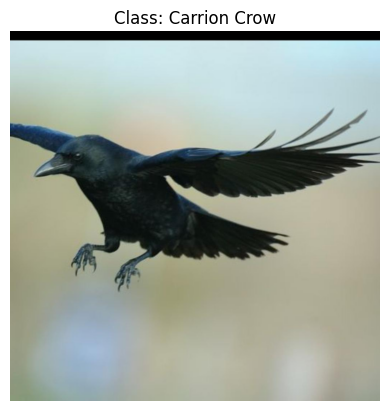

time: 212 ms (started: 2025-03-20 18:32:33 +00:00)


In [ ]:
sub_dir = "withBackground"
sub_dir_path = os.path.join(dataset_path, sub_dir)

class_dirs = os.listdir(sub_dir_path)
random_class = random.choice(class_dirs)

class_images = os.listdir(os.path.join(sub_dir_path, random_class))
random_image = random.choice(class_images)

image_path = os.path.join(sub_dir_path, random_class, random_image)
title = f"Class: {random_class.replace('_', ' ')}"

image = Image.open(image_path)
plt.imshow(image)
plt.axis("off")
plt.title(title)
plt.show()

# Preprocessing

### Split Dataset into Train, Validation and Test Sets

This code splits the dataset by copying images into a new `working` directory, dividing them into 70% for training, 10% for validation, and 20% for testing.

In [ ]:
train_ds_path = "/content/dataset/working/train/"
validation_ds_path = "/content/dataset/working/valid/"
test_ds_path = "/content/dataset/working/test/"
train_ratio = 0.7
validate_ratio = 0.1
test_ratio = 0.2

shutil.rmtree(train_ds_path, ignore_errors=True)
shutil.rmtree(validation_ds_path, ignore_errors=True)
shutil.rmtree(test_ds_path, ignore_errors=True)

os.makedirs(train_ds_path)
os.makedirs(validation_ds_path)
os.makedirs(test_ds_path)

for item in os.listdir(sub_dir_path):
    item_path = os.path.join(sub_dir_path, item)

    if os.path.isdir(item_path):
        os.makedirs(os.path.join(train_ds_path, item))
        os.makedirs(os.path.join(validation_ds_path, item))
        os.makedirs(os.path.join(test_ds_path, item))
        files = os.listdir(item_path)
        random.shuffle(files)
        num_images= len(files)
        train_images, validate_images, test_images = np.split(files, [int(num_images * train_ratio), int(num_images * (validate_ratio + train_ratio))])

        for image_path in train_images:
            src = os.path.join(item_path, image_path)
            dst = os.path.join(train_ds_path, item, image_path)
            shutil.copy(src, dst)

        for image_path in validate_images:
            src = os.path.join(item_path, image_path)
            dst = os.path.join(validation_ds_path, item, image_path)
            shutil.copy(src, dst)

        for image_path in test_images:
            src = os.path.join(item_path, image_path)
            dst = os.path.join(test_ds_path, item, image_path)
            shutil.copy(src, dst)

time: 590 ms (started: 2025-03-20 18:32:33 +00:00)


### Create Dataset

This code sets a batch size of 32 and image size of 128x128, defines data augmentation with 2 ops of random rotation and zoom, and builds datasets from paths. It loads, decodes, resizes, and augments JPEG images, normalizes them to [-1, 1] (one grayscale, one color), then shuffles, batches, and prefetches. It creates train (augmented), validation, and test datasets, printing their sizes.

In [ ]:
batch_size = 32
image_size = (128, 128)

data_augmentation = layers.Pipeline([
    layers.RandomRotation(factor=0.3),
    layers.RandomZoom(height_factor=(0.2, 0.3), width_factor=(0.2, 0.3))
])

def build_dataset_from_path(path, augment=False):
    path_mask = f"{path}*/*.jpg"

    images_dataset = (
        tf.data.Dataset.list_files(path_mask)
        .map(lambda file_name: tf.io.read_file(file_name), num_parallel_calls=tf.data.AUTOTUNE)
        .map(lambda file_content: tf.image.decode_jpeg(file_content, channels=3), num_parallel_calls=tf.data.AUTOTUNE)
        .map(lambda img: tf.image.resize(img, image_size), num_parallel_calls=tf.data.AUTOTUNE)
    )

    preloaded_dataset = np.array([x for x in images_dataset])
    images_dataset = tf.data.Dataset.from_tensor_slices((preloaded_dataset))

    if augment:
        images_dataset = images_dataset.map(
            lambda img: data_augmentation(img), num_parallel_calls=tf.data.AUTOTUNE
        )

    normalized_dataset = images_dataset.map(
        lambda img: (tf.image.rgb_to_grayscale(img) / 127.5 - 1.0, img / 127.5 - 1.0), num_parallel_calls=tf.data.AUTOTUNE
    )


    print(f"Created Dataset with {len(images_dataset)} images.")
    return normalized_dataset.shuffle(1000).batch(batch_size).prefetch(tf.data.AUTOTUNE)

print("Creating the Train Set:")
train_dataset = build_dataset_from_path(train_ds_path, augment=True)
print("\nCreating the Validation Set:")
validation_dataset = build_dataset_from_path(validation_ds_path)
print("\nCreating the Test Set:")
test_dataset = build_dataset_from_path(test_ds_path)

Creating the Train Set:
Created Dataset with 1986 images.

Creating the Validation Set:
Created Dataset with 269 images.

Creating the Test Set:
Created Dataset with 586 images.
time: 2.92 s (started: 2025-03-20 18:33:53 +00:00)


# Experiments

In our course, we studied the paper `Image-to-Image Translation with Conditional Adversarial Networks` by Isola et al. (2017), where Berkeley researchers developed a model for image-to-image translation tasks, such as our image colorization problem. In this notebook, we will test their claims by conducting three experiments. The first experiment will implement a naive cGAN with standard GAN loss (BCE). In the second and third experiments, we will incorporate key improvements from their best model, `Pix2Pix`, which they claim enhances performance for such tasks.

In each experiment, we build a cGAN from scratch. The generator architecture is consistent across all experiments, except for adding skip connections in the third. The discriminator architecture is also the same, except in the third experiment, to highlight key changes while keeping other factors constant. Below are the shared settings:

- **Activation Functions**: `LeakyReLU` (slope 0.2) for all layers, except:
  - Generator’s last layer: `tanh` for [-1, 1] output
  - Discriminator’s last layer: `Sigmoid` for [0, 1] output
- **Batch Normalization**: Applied after each generator conv layer
- **Discriminator Loss**: BCE with label softening
- **Optimizer**: Adam
  - learning rate: 0.0002
  - beta_1: 0.5
  - beta_2: 0.999
- **Batch Size**: 32
- **Epochs**: Max 400, but training stops after 15 minutes

## Training Functions
The following functions are used to build, train, and evaluate the models.

### Function - Build cGAN Generator
This function constructs a CNN/U-Net generator for the cGAN.

In [ ]:
def build_cgan_generator(is_u_net=False):
    inputs = layers.Input(shape=(128, 128, 1))  # Grayscale input

    # Encoder
    conv1 = layers.Conv2D(64, kernel_size=4, strides=2, padding='same')(inputs)
    conv1 = LeakyReLU(negative_slope=0.2)(conv1)
    conv1 = layers.BatchNormalization()(conv1)

    conv2 = layers.Conv2D(128, kernel_size=4, strides=2, padding='same')(conv1)
    conv2 = LeakyReLU(negative_slope=0.2)(conv2)
    conv2 = layers.BatchNormalization()(conv2)

    # Bottleneck
    bottleneck = layers.Conv2D(256, kernel_size=4, strides=2, padding='same')(conv2)
    bottleneck = LeakyReLU(negative_slope=0.2)(bottleneck)
    bottleneck = layers.BatchNormalization()(bottleneck)

    # Decoder
    deconv1 = layers.Conv2DTranspose(128, kernel_size=4, strides=2, padding='same')(bottleneck)
    deconv1 = LeakyReLU(negative_slope=0.2)(deconv1)
    deconv1 = layers.BatchNormalization()(deconv1)

    if is_u_net:
        # Skip connection from conv2
        skip1 = layers.Concatenate()([deconv1, conv2])
    else:
        skip1 = deconv1

    deconv2 = layers.Conv2DTranspose(64, kernel_size=4, strides=2, padding='same')(skip1)
    deconv2 = LeakyReLU(negative_slope=0.2)(deconv2)
    deconv2 = layers.BatchNormalization()(deconv2)

    if is_u_net:
        # Skip connection from conv1
        skip2 = layers.Concatenate()([deconv2, conv1])
    else:
        skip2 = deconv2

    deconv3 = layers.Conv2DTranspose(3, kernel_size=4, strides=2, padding='same')(skip2)
    output = layers.Activation('tanh')(deconv3)  # Output layer

    model = tf.keras.Model(inputs=inputs, outputs=output)

    return model

time: 999 µs (started: 2025-03-20 18:32:45 +00:00)


### Function - Build cGAN Discriminator
This function constructs a CNN/PatchGAN discriminator for the cGAN.

In [ ]:
def build_cgan_discriminator(is_patchgan=False):
    model = tf.keras.Sequential([
        layers.InputLayer(shape=(128, 128, 3)),  # RGB input
        layers.Conv2D(32, kernel_size=4, strides=2, padding='same'),
        LeakyReLU(negative_slope=0.2),
        layers.Conv2D(64, kernel_size=4, strides=2, padding='same'),
        LeakyReLU(negative_slope=0.2),
    ])

    if is_patchgan:
        # PatchGAN-specific layers
        model.add(layers.Conv2D(128, kernel_size=4, strides=2, padding='same'))
        model.add(LeakyReLU(negative_slope=0.2))
        model.add(layers.Conv2D(256, kernel_size=4, strides=2, padding='same'))
        model.add(LeakyReLU(negative_slope=0.2))
        model.add(layers.Conv2D(1, kernel_size=4, strides=1, padding='same'))  # Patch-level real/fake classification
    else:
        # Regular discriminator with a final dense layer
        model.add(layers.Flatten())
        model.add(layers.Dense(1, activation='sigmoid'))  # Real/Fake classification

    return model

time: 657 µs (started: 2025-03-20 18:32:45 +00:00)


### Function - Plot Metrics
This function visualizes training metrics across epochs in three subplots: generator and discriminator loss, discriminator accuracy, and MSE/MAE scores.

In [ ]:
def plot_metrics(generator_loss, discriminator_loss, discriminator_accuracy, mse_scores, mae_scores, epochs):
    fig, axes = plt.subplots(1, 3, figsize=(20, 6))

    # Plot 1: Generator and Discriminator Loss
    axes[0].plot(epochs, generator_loss, label='Generator Loss', color='blue')
    axes[0].plot(epochs, discriminator_loss, label='Discriminator Loss', color='red')
    axes[0].set_title('Loss vs Epochs')
    axes[0].set_xlabel('Epochs')
    axes[0].set_ylabel('Loss')
    axes[0].legend()

    # Plot 2: Discriminator Accuracy
    axes[1].plot(epochs, discriminator_accuracy, label='Discriminator Accuracy', color='green')
    axes[1].set_title('Discriminator Accuracy vs Epochs')
    axes[1].set_xlabel('Epochs')
    axes[1].set_ylabel('Accuracy')

    # Plot 3: MSE and MAE Scores
    axes[2].plot(epochs, mse_scores, label='MSE', color='orange')
    axes[2].plot(epochs, mae_scores, label='MAE', color='purple')
    axes[2].set_title('MSE and MAE vs Epochs')
    axes[2].set_xlabel('Epochs')
    axes[2].set_ylabel('Score')
    axes[2].legend()

    plt.tight_layout()
    plt.show()

time: 672 µs (started: 2025-03-20 18:32:45 +00:00)


### Function - Visualize Predictions

This function displays model predictions by taking the first 7 images from a dataset batch. It includes a `denormalize` helper to scale images from [-1, 1] to [0, 1]. For non-final visualizations, it shows original color images and predictions. For final visualizations, it adds grayscale inputs alongside original and predicted images.

In [ ]:
def denormalize(image):
    return (image + 1) / 2  # Convert from [-1, 1] to [0, 1]

def visualize_predictions(generator, dataset, title_suffix='', final=False):
    for X_batch, y_batch in dataset.take(1):
        # Grab the first 7 images from the batch
        X_test = X_batch[:7]
        y_test = y_batch[:7]

    # Generate predictions from the generator
    preds = generator(X_test, training=False)  # Set training=False to avoid unnecessary updates

    num_images = 7  # Number of images to display
    plt.figure(figsize=(15, 6))

    for i in range(num_images):
        if final:
            plt.subplot(3, num_images, i + 1)
            plt.imshow(denormalize(y_test[i]))
            plt.axis("off")
            plt.title("Original")

            # Grayscale input image
            plt.subplot(3, num_images, num_images + i + 1)
            plt.imshow(denormalize(X_test[i, :, :, 0]), cmap="gray")
            plt.axis("off")
            plt.title("Grayscale")

            # Predicted color image
            plt.subplot(3, num_images, 2 * num_images + i + 1)
            plt.imshow(denormalize(preds[i]))
            plt.axis("off")
            plt.title("Predicted")
        else:
            # For non-final, just show the original (non-grayscale) input and prediction
            plt.subplot(2, num_images, i + 1)
            plt.imshow(denormalize(y_test[i]))
            plt.axis("off")

            plt.subplot(2, num_images, num_images + i + 1)
            plt.imshow(denormalize(preds[i]))
            plt.axis("off")

    if final:
        plt.suptitle(f"Model Predictions {title_suffix}", fontsize=16)
    plt.tight_layout()
    plt.show()

time: 1.35 ms (started: 2025-03-20 18:32:45 +00:00)


### Function - Train cGAN

This function trains the cGAN for up to 400 epochs or 30 minutes, whichever comes first. It iterates over the training dataset, computing generator and discriminator losses, updating weights with optimizers, and tracking metrics (losses, discriminator accuracy, MSE, and MAE on the validation set). Every 10 epochs, it visualizes predictions, and at the end, it plots all metrics.

In [ ]:
def train_cgan(generator, discriminator,
               generator_optimizer, discriminator_optimizer,
               generator_loss_function, discriminator_loss_function,
               num_epochs=400, max_time_seconds=900): # 15 minutes
    start_time = time.time()

    # Setup for tracking metrics
    generator_losses = []
    discriminator_losses = []
    discriminator_accuracies = []
    mse_scores = []
    mae_scores = []
    epochs = []

    # Training loop with metrics tracking
    for epoch in range(num_epochs):
        gen_loss_avg = 0
        disc_loss_avg = 0
        disc_accuracy_avg = 0

        # Iterate through batches of the dataset
        for gray_images, real_images in train_dataset:
            with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
                generated_images = generator(gray_images, training=True)

                real_output = discriminator(real_images, training=True)
                fake_output = discriminator(generated_images, training=True)

                # Calculate losses
                gen_loss = generator_loss_function(fake_output, generated_images, real_images)
                disc_loss = discriminator_loss_function(real_output, fake_output)

            # Compute gradients and update weights
            gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
            gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

            generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

            # Track metrics
            gen_loss_avg += gen_loss.numpy()
            disc_loss_avg += disc_loss.numpy()

            # Discriminator accuracy
            disc_accuracy = tf.keras.metrics.BinaryAccuracy()(tf.ones_like(real_output), real_output) + \
                             tf.keras.metrics.BinaryAccuracy()(tf.zeros_like(fake_output), fake_output)
            disc_accuracy_avg += disc_accuracy.numpy() / 2

        # Plot generated images every 10 epochs using the first batch
        if (epoch + 1) % 10 == 0:
            visualize_predictions(generator, train_dataset)

        # Average out the metrics
        num_batches = len(train_dataset)
        gen_loss_avg /= num_batches
        disc_loss_avg /= num_batches
        disc_accuracy_avg /= num_batches

        # Store metrics for plotting
        generator_losses.append(gen_loss_avg)
        discriminator_losses.append(disc_loss_avg)
        discriminator_accuracies.append(disc_accuracy_avg)
        epochs.append(epoch)

        # Calculate MSE and MAE scores for this epoch using the entire validation set
        all_generated_images = []
        all_real_images = []

        # Iterate over the entire validation set
        for gray_images, real_images in validation_dataset:
            generated_images = generator(gray_images, training=False)  # Generate images for the current batch
            all_generated_images.append(generated_images)
            all_real_images.append(real_images)

        # Concatenate all generated and real images from the validation set
        all_generated_images = np.concatenate(all_generated_images, axis=0)
        all_real_images = np.concatenate(all_real_images, axis=0)

        # Calculate MSE (Mean Squared Error) between real and generated images
        mse_score = np.mean(np.square(all_real_images - all_generated_images))
        mse_scores.append(mse_score)

        # Calculate MAE (Mean Absolute Error) between real and generated images
        mae_score = np.mean(np.abs(all_real_images - all_generated_images))
        mae_scores.append(mae_score)

        # Print progress for this epoch
        print(f"Epoch {epoch+1}/{num_epochs} - "
              f"Generator Loss: {gen_loss_avg:.4f}, "
              f"Discriminator Loss: {disc_loss_avg:.4f}, "
              f"Discriminator Accuracy: {disc_accuracy_avg:.4f}, "
              f"Val MSE Score: {mse_score:.4f}, "
              f"Val MAE Score: {mae_score:.4f}.")

        if time.time() - start_time > max_time_seconds:
            break

    # Plot losses and evaluation metrics
    plot_metrics(generator_losses, discriminator_losses, discriminator_accuracies, mse_scores, mae_scores, epochs)

time: 2.09 ms (started: 2025-03-20 18:35:34 +00:00)


## Experiment 1 - Basic Image-to-Image cGAN

In this experiment, we build a simple cGAN using a CNN-based generator and discriminator, trained with standard BCE loss.

### Build the Model

In [ ]:
# Build the Generator and Discriminator models
generator_1 = build_cgan_generator()
discriminator_1 = build_cgan_discriminator()

# Define the optimizers for both Generator and Discriminator
generator_optimizer_1 = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999)
discriminator_optimizer_1 = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999)

# Define the Binary Cross-Entropy loss function for both Generator and Discriminator
cross_entropy = tf.keras.losses.BinaryCrossentropy()

# Generator loss: focuses on tricking the discriminator by making fake images look real
def generator_loss(fake_output, real_images=None, generated_images=None):
    return cross_entropy(tf.ones_like(fake_output), fake_output)  # Fake -> label 1 (target: real)

# Discriminator loss: focuses on the classification of real and fake images
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output) * 0.9, real_output)  # Real -> label 0.9 (soft label)
    fake_loss = cross_entropy(tf.zeros_like(fake_output) + 0.1, fake_output)  # Fake -> label 0.1 (soft label)
    return real_loss + fake_loss

time: 811 ms (started: 2025-03-20 18:32:48 +00:00)


### Train the Model

Epoch 1/400 - Generator Loss: 0.7300, Discriminator Loss: 1.3710, Discriminator Accuracy: 0.5548, Val MSE Score: 0.3622, Val MAE Score: 0.4887.
Epoch 2/400 - Generator Loss: 0.7468, Discriminator Loss: 1.3585, Discriminator Accuracy: 0.5811, Val MSE Score: 0.1556, Val MAE Score: 0.3182.
Epoch 3/400 - Generator Loss: 0.7338, Discriminator Loss: 1.3657, Discriminator Accuracy: 0.5635, Val MSE Score: 0.1166, Val MAE Score: 0.2584.
Epoch 4/400 - Generator Loss: 0.7331, Discriminator Loss: 1.3809, Discriminator Accuracy: 0.5221, Val MSE Score: 0.2315, Val MAE Score: 0.3705.
Epoch 5/400 - Generator Loss: 0.7256, Discriminator Loss: 1.3769, Discriminator Accuracy: 0.5558, Val MSE Score: 0.2101, Val MAE Score: 0.3466.
Epoch 6/400 - Generator Loss: 0.7398, Discriminator Loss: 1.3599, Discriminator Accuracy: 0.5756, Val MSE Score: 0.1511, Val MAE Score: 0.2949.
Epoch 7/400 - Generator Loss: 0.7421, Discriminator Loss: 1.3543, Discriminator Accuracy: 0.5903, Val MSE Score: 0.4518, Val MAE Score: 

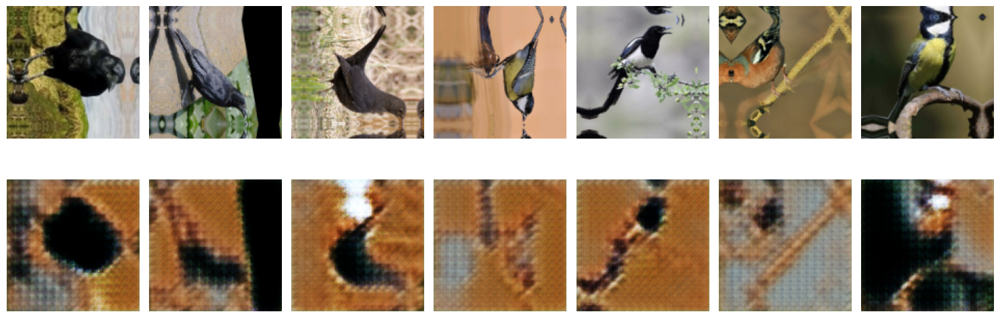

Epoch 10/400 - Generator Loss: 0.7347, Discriminator Loss: 1.3584, Discriminator Accuracy: 0.5754, Val MSE Score: 0.1787, Val MAE Score: 0.3116.
Epoch 11/400 - Generator Loss: 0.7323, Discriminator Loss: 1.3646, Discriminator Accuracy: 0.5833, Val MSE Score: 0.3761, Val MAE Score: 0.4672.
Epoch 12/400 - Generator Loss: 0.7754, Discriminator Loss: 1.3431, Discriminator Accuracy: 0.5838, Val MSE Score: 0.1086, Val MAE Score: 0.2460.
Epoch 13/400 - Generator Loss: 0.7322, Discriminator Loss: 1.3673, Discriminator Accuracy: 0.5694, Val MSE Score: 0.1024, Val MAE Score: 0.2397.
Epoch 14/400 - Generator Loss: 0.7304, Discriminator Loss: 1.3636, Discriminator Accuracy: 0.5672, Val MSE Score: 0.1632, Val MAE Score: 0.3074.
Epoch 15/400 - Generator Loss: 0.7391, Discriminator Loss: 1.3602, Discriminator Accuracy: 0.5821, Val MSE Score: 0.1752, Val MAE Score: 0.3119.
Epoch 16/400 - Generator Loss: 0.7729, Discriminator Loss: 1.3466, Discriminator Accuracy: 0.6029, Val MSE Score: 0.6384, Val MAE 

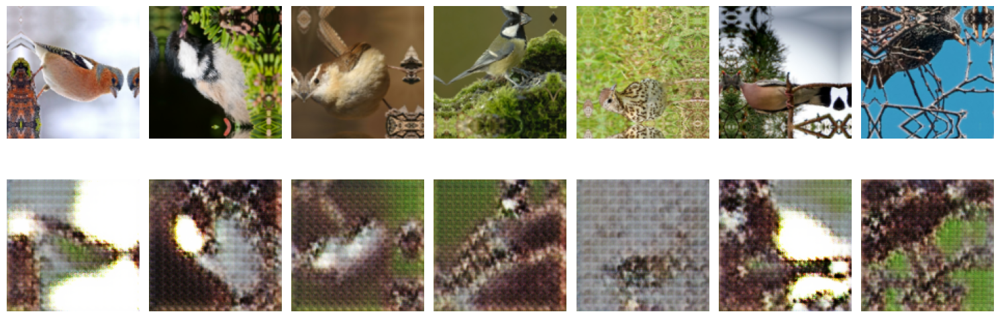

Epoch 20/400 - Generator Loss: 0.7249, Discriminator Loss: 1.3644, Discriminator Accuracy: 0.5665, Val MSE Score: 0.1109, Val MAE Score: 0.2480.
Epoch 21/400 - Generator Loss: 0.7337, Discriminator Loss: 1.3734, Discriminator Accuracy: 0.5565, Val MSE Score: 0.1458, Val MAE Score: 0.2863.
Epoch 22/400 - Generator Loss: 0.7378, Discriminator Loss: 1.3547, Discriminator Accuracy: 0.5895, Val MSE Score: 0.6575, Val MAE Score: 0.5734.
Epoch 23/400 - Generator Loss: 0.7753, Discriminator Loss: 1.3460, Discriminator Accuracy: 0.6032, Val MSE Score: 0.1472, Val MAE Score: 0.2950.
Epoch 24/400 - Generator Loss: 0.7472, Discriminator Loss: 1.3451, Discriminator Accuracy: 0.5811, Val MSE Score: 0.1899, Val MAE Score: 0.3382.
Epoch 25/400 - Generator Loss: 0.7585, Discriminator Loss: 1.3519, Discriminator Accuracy: 0.5863, Val MSE Score: 0.3762, Val MAE Score: 0.4741.
Epoch 26/400 - Generator Loss: 0.7731, Discriminator Loss: 1.3373, Discriminator Accuracy: 0.6109, Val MSE Score: 0.2309, Val MAE 

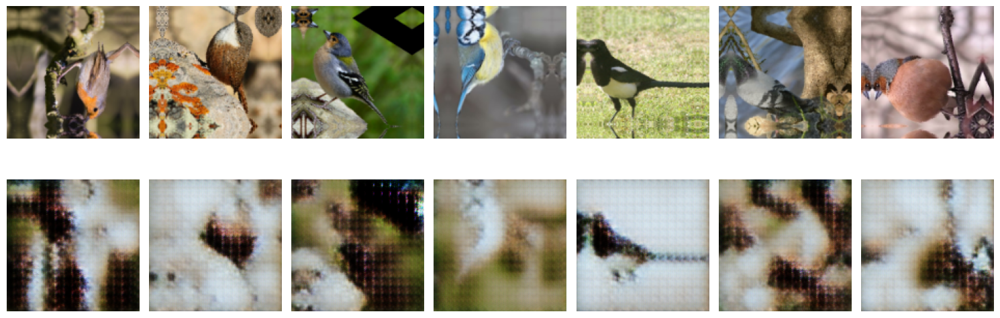

Epoch 30/400 - Generator Loss: 0.7866, Discriminator Loss: 1.3281, Discriminator Accuracy: 0.6133, Val MSE Score: 0.1380, Val MAE Score: 0.2823.
Epoch 31/400 - Generator Loss: 0.8177, Discriminator Loss: 1.3164, Discriminator Accuracy: 0.6233, Val MSE Score: 0.1630, Val MAE Score: 0.2963.
Epoch 32/400 - Generator Loss: 0.7684, Discriminator Loss: 1.3595, Discriminator Accuracy: 0.5938, Val MSE Score: 0.1413, Val MAE Score: 0.2855.
Epoch 33/400 - Generator Loss: 0.7862, Discriminator Loss: 1.3428, Discriminator Accuracy: 0.5992, Val MSE Score: 0.1098, Val MAE Score: 0.2556.
Epoch 34/400 - Generator Loss: 0.7337, Discriminator Loss: 1.3596, Discriminator Accuracy: 0.5717, Val MSE Score: 0.1113, Val MAE Score: 0.2466.
Epoch 35/400 - Generator Loss: 0.7651, Discriminator Loss: 1.3453, Discriminator Accuracy: 0.6089, Val MSE Score: 0.1504, Val MAE Score: 0.2948.
Epoch 36/400 - Generator Loss: 0.7789, Discriminator Loss: 1.3468, Discriminator Accuracy: 0.6153, Val MSE Score: 0.1020, Val MAE 

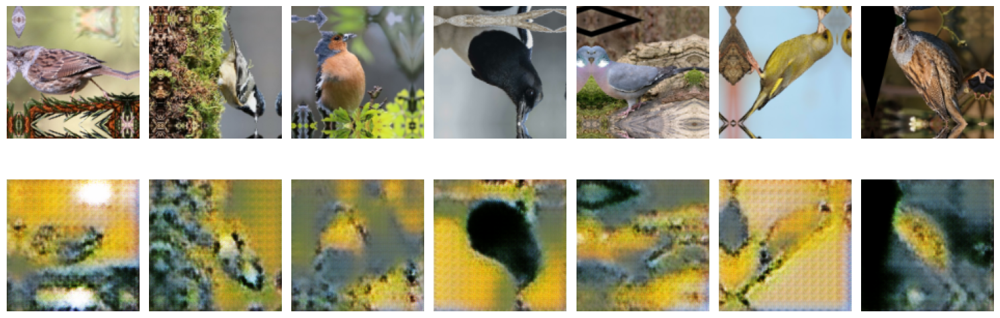

Epoch 40/400 - Generator Loss: 0.7460, Discriminator Loss: 1.3443, Discriminator Accuracy: 0.6029, Val MSE Score: 0.1274, Val MAE Score: 0.2543.
Epoch 41/400 - Generator Loss: 0.7548, Discriminator Loss: 1.3568, Discriminator Accuracy: 0.5838, Val MSE Score: 0.1244, Val MAE Score: 0.2464.
Epoch 42/400 - Generator Loss: 0.7575, Discriminator Loss: 1.3364, Discriminator Accuracy: 0.6198, Val MSE Score: 0.1049, Val MAE Score: 0.2413.
Epoch 43/400 - Generator Loss: 0.7629, Discriminator Loss: 1.3356, Discriminator Accuracy: 0.6109, Val MSE Score: 0.1228, Val MAE Score: 0.2618.
Epoch 44/400 - Generator Loss: 0.7513, Discriminator Loss: 1.3560, Discriminator Accuracy: 0.5764, Val MSE Score: 0.1101, Val MAE Score: 0.2431.
Epoch 45/400 - Generator Loss: 0.7592, Discriminator Loss: 1.3563, Discriminator Accuracy: 0.5846, Val MSE Score: 0.1341, Val MAE Score: 0.2629.
Epoch 46/400 - Generator Loss: 0.7447, Discriminator Loss: 1.3663, Discriminator Accuracy: 0.5650, Val MSE Score: 0.0981, Val MAE 

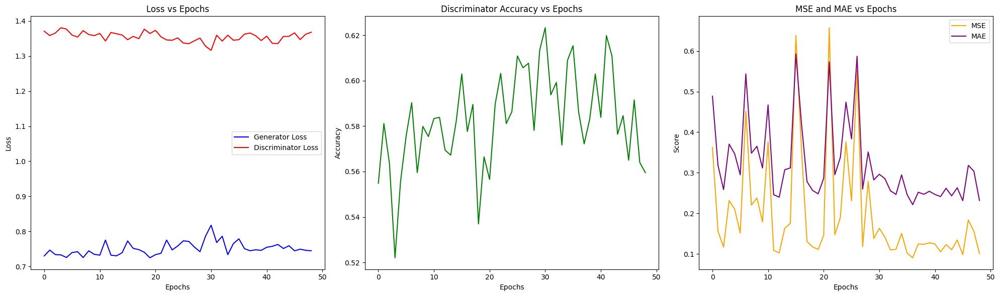

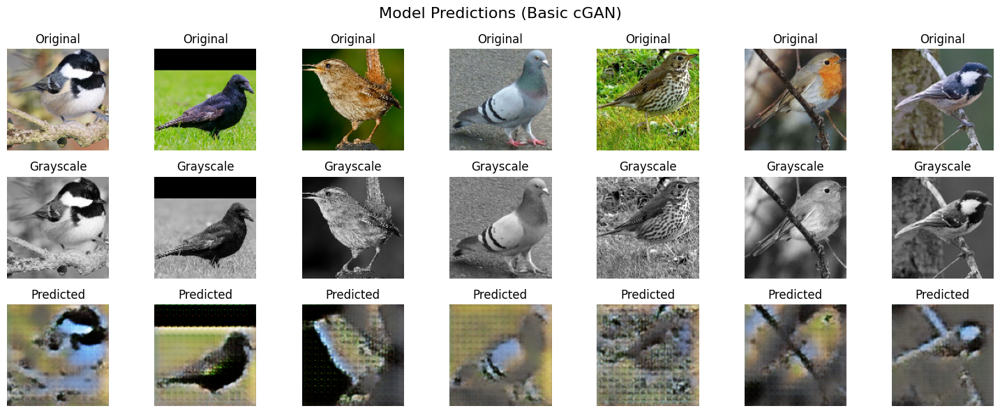

time: 15min 14s (started: 2025-03-20 18:36:34 +00:00)


In [ ]:
train_cgan(generator_1, discriminator_1,
               generator_optimizer_1, discriminator_optimizer_1,
               generator_loss, discriminator_loss)

generator_1.save('model_1_generator.keras')

visualize_predictions(generator_1, validation_dataset, title_suffix="(Basic cGAN)", final=True)

## Experiment 2 - Basic cGAN with BCE+MAE Generator Loss

In this experiment, we modify the generator loss to combine Binary Cross-Entropy (BCE) and Mean Absolute Error (MAE). This approach is commonly used in cGANs, including Pix2Pix, and we expect better results.

### Build the Model

In [ ]:
# Build the Generator and Discriminator models
generator_2 = build_cgan_generator()
discriminator_2 = build_cgan_discriminator()

# Define the optimizers for both Generator and Discriminator
generator_optimizer_2 = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999)
discriminator_optimizer_2 = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999)

# Generator loss: focuses on tricking the discriminator by making fake images look real
def generator_bce_mae_loss(fake_output, generated_images, real_images, lambda_mae=100):
    # Binary Cross-Entropy loss (BCE)
    bce_loss = generator_loss(fake_output)

    # Mean Absolute Error loss (MAE)
    mae_loss = tf.reduce_mean(tf.abs(generated_images - real_images))  # Pixel-wise difference between generated and real images

    # Total generator loss is the sum of BCE and weighted MAE loss
    return bce_loss + lambda_mae * mae_loss

time: 111 ms (started: 2025-03-20 18:51:48 +00:00)


### Train the Model

Epoch 1/400 - Generator Loss: 22.8750, Discriminator Loss: 1.2147, Discriminator Accuracy: 0.7207, Val MSE Score: 0.2360, Val MAE Score: 0.4003.
Epoch 2/400 - Generator Loss: 17.7743, Discriminator Loss: 1.1444, Discriminator Accuracy: 0.8095, Val MSE Score: 0.2100, Val MAE Score: 0.3733.
Epoch 3/400 - Generator Loss: 16.7165, Discriminator Loss: 1.1185, Discriminator Accuracy: 0.8239, Val MSE Score: 0.1710, Val MAE Score: 0.3362.
Epoch 4/400 - Generator Loss: 16.3097, Discriminator Loss: 1.1172, Discriminator Accuracy: 0.8043, Val MSE Score: 0.1475, Val MAE Score: 0.3111.
Epoch 5/400 - Generator Loss: 15.9834, Discriminator Loss: 1.0604, Discriminator Accuracy: 0.8403, Val MSE Score: 0.1357, Val MAE Score: 0.2997.
Epoch 6/400 - Generator Loss: 16.1900, Discriminator Loss: 1.0599, Discriminator Accuracy: 0.8366, Val MSE Score: 0.1354, Val MAE Score: 0.2964.
Epoch 7/400 - Generator Loss: 16.0077, Discriminator Loss: 1.0529, Discriminator Accuracy: 0.8338, Val MSE Score: 0.1052, Val MAE 

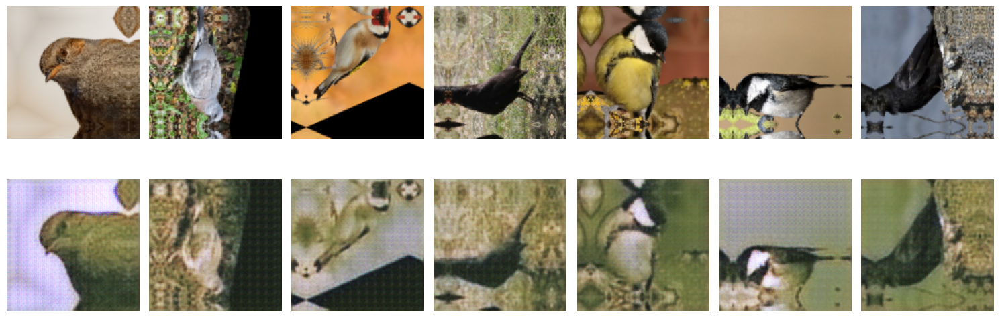

Epoch 10/400 - Generator Loss: 15.2291, Discriminator Loss: 1.0283, Discriminator Accuracy: 0.8584, Val MSE Score: 0.0511, Val MAE Score: 0.1699.
Epoch 11/400 - Generator Loss: 14.9840, Discriminator Loss: 1.0278, Discriminator Accuracy: 0.8547, Val MSE Score: 0.0435, Val MAE Score: 0.1494.
Epoch 12/400 - Generator Loss: 15.0415, Discriminator Loss: 1.0017, Discriminator Accuracy: 0.8651, Val MSE Score: 0.0475, Val MAE Score: 0.1610.
Epoch 13/400 - Generator Loss: 14.7413, Discriminator Loss: 1.0054, Discriminator Accuracy: 0.8740, Val MSE Score: 0.0537, Val MAE Score: 0.1742.
Epoch 14/400 - Generator Loss: 14.7738, Discriminator Loss: 1.0184, Discriminator Accuracy: 0.8681, Val MSE Score: 0.0396, Val MAE Score: 0.1399.
Epoch 15/400 - Generator Loss: 14.9612, Discriminator Loss: 0.9955, Discriminator Accuracy: 0.8802, Val MSE Score: 0.0408, Val MAE Score: 0.1454.
Epoch 16/400 - Generator Loss: 14.7918, Discriminator Loss: 1.0236, Discriminator Accuracy: 0.8611, Val MSE Score: 0.0436, V

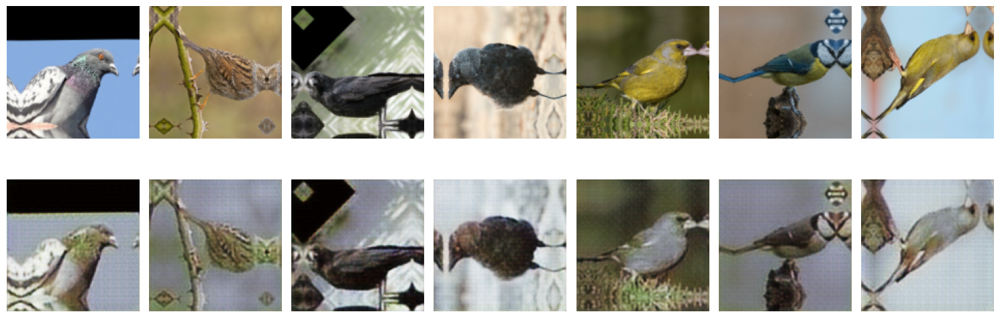

Epoch 20/400 - Generator Loss: 14.6135, Discriminator Loss: 1.0208, Discriminator Accuracy: 0.8584, Val MSE Score: 0.0394, Val MAE Score: 0.1374.
Epoch 21/400 - Generator Loss: 13.9635, Discriminator Loss: 1.0287, Discriminator Accuracy: 0.8619, Val MSE Score: 0.0442, Val MAE Score: 0.1486.
Epoch 22/400 - Generator Loss: 14.3421, Discriminator Loss: 1.0253, Discriminator Accuracy: 0.8641, Val MSE Score: 0.0439, Val MAE Score: 0.1489.
Epoch 23/400 - Generator Loss: 14.1264, Discriminator Loss: 1.0561, Discriminator Accuracy: 0.8487, Val MSE Score: 0.0450, Val MAE Score: 0.1507.
Epoch 24/400 - Generator Loss: 14.1634, Discriminator Loss: 1.0395, Discriminator Accuracy: 0.8566, Val MSE Score: 0.0388, Val MAE Score: 0.1354.
Epoch 25/400 - Generator Loss: 14.2703, Discriminator Loss: 1.0408, Discriminator Accuracy: 0.8601, Val MSE Score: 0.0401, Val MAE Score: 0.1411.
Epoch 26/400 - Generator Loss: 14.1413, Discriminator Loss: 1.0534, Discriminator Accuracy: 0.8495, Val MSE Score: 0.0386, V

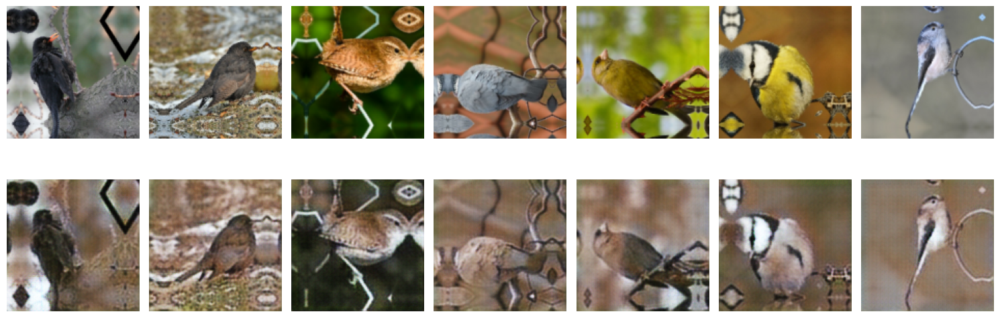

Epoch 30/400 - Generator Loss: 13.8324, Discriminator Loss: 1.0384, Discriminator Accuracy: 0.8584, Val MSE Score: 0.0403, Val MAE Score: 0.1437.
Epoch 31/400 - Generator Loss: 13.8528, Discriminator Loss: 1.0633, Discriminator Accuracy: 0.8433, Val MSE Score: 0.0461, Val MAE Score: 0.1545.
Epoch 32/400 - Generator Loss: 13.8329, Discriminator Loss: 1.0645, Discriminator Accuracy: 0.8465, Val MSE Score: 0.0428, Val MAE Score: 0.1459.
Epoch 33/400 - Generator Loss: 13.8935, Discriminator Loss: 1.0571, Discriminator Accuracy: 0.8500, Val MSE Score: 0.0447, Val MAE Score: 0.1471.
Epoch 34/400 - Generator Loss: 14.0004, Discriminator Loss: 1.0598, Discriminator Accuracy: 0.8490, Val MSE Score: 0.0404, Val MAE Score: 0.1380.
Epoch 35/400 - Generator Loss: 13.8071, Discriminator Loss: 1.0643, Discriminator Accuracy: 0.8408, Val MSE Score: 0.0434, Val MAE Score: 0.1522.
Epoch 36/400 - Generator Loss: 14.0798, Discriminator Loss: 1.0771, Discriminator Accuracy: 0.8311, Val MSE Score: 0.0381, V

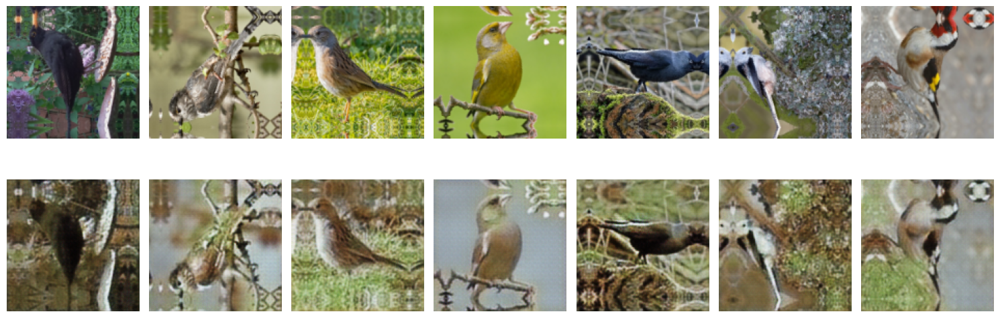

Epoch 40/400 - Generator Loss: 13.7958, Discriminator Loss: 1.0560, Discriminator Accuracy: 0.8482, Val MSE Score: 0.0374, Val MAE Score: 0.1352.
Epoch 41/400 - Generator Loss: 13.7714, Discriminator Loss: 1.0692, Discriminator Accuracy: 0.8338, Val MSE Score: 0.0452, Val MAE Score: 0.1515.
Epoch 42/400 - Generator Loss: 13.6583, Discriminator Loss: 1.0480, Discriminator Accuracy: 0.8477, Val MSE Score: 0.0384, Val MAE Score: 0.1390.
Epoch 43/400 - Generator Loss: 13.5417, Discriminator Loss: 1.0542, Discriminator Accuracy: 0.8480, Val MSE Score: 0.0373, Val MAE Score: 0.1331.
Epoch 44/400 - Generator Loss: 13.6903, Discriminator Loss: 1.0718, Discriminator Accuracy: 0.8341, Val MSE Score: 0.0651, Val MAE Score: 0.1659.
Epoch 45/400 - Generator Loss: 14.0533, Discriminator Loss: 1.0439, Discriminator Accuracy: 0.8574, Val MSE Score: 0.0374, Val MAE Score: 0.1327.
Epoch 46/400 - Generator Loss: 13.5801, Discriminator Loss: 1.0581, Discriminator Accuracy: 0.8435, Val MSE Score: 0.0368, V

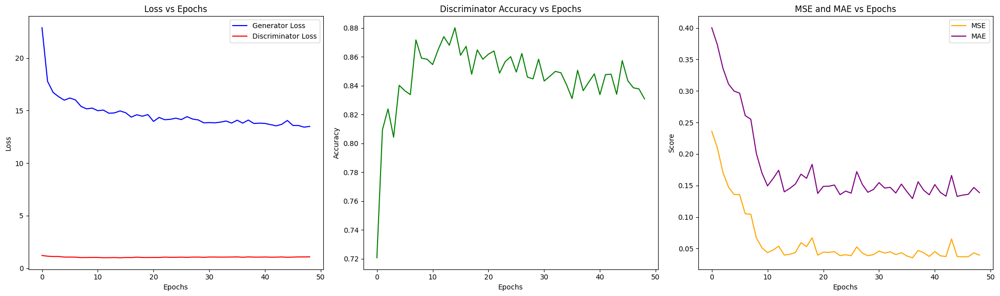

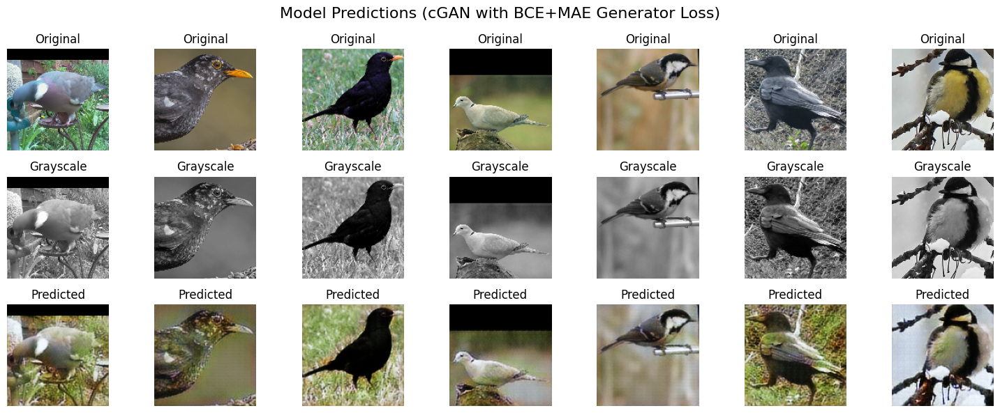

time: 15min 16s (started: 2025-03-20 18:51:48 +00:00)


In [ ]:
train_cgan(generator_2, discriminator_2,
           generator_optimizer_2, discriminator_optimizer_2,
           generator_bce_mae_loss, discriminator_loss)

generator_2.save('model_2_generator.keras')

visualize_predictions(generator_2, validation_dataset, title_suffix="(cGAN with BCE+MAE Generator Loss)", final=True)

## Experiment 3 - cGAN with U-Net Generator and PatchGAN Discriminator

In this experiment, we replace the standard CNN generator with a U-Net and the regular CNN discriminator with a PatchGAN. This setup closely follows the architecture used in Pix2Pix.

### Build the Model

In [ ]:
# Build the Generator and Discriminator models
generator_3 = build_cgan_generator(is_u_net=True)
discriminator_3 = build_cgan_discriminator(is_patchgan=True)

# Define the optimizers for both Generator and Discriminator
generator_optimizer_3 = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999)
discriminator_optimizer_3 = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5, beta_2=0.999)

time: 141 ms (started: 2025-03-20 19:07:05 +00:00)


### Train the Model

Epoch 1/400 - Generator Loss: 22.9098, Discriminator Loss: 1.7153, Discriminator Accuracy: 0.5458, Val MSE Score: 0.2046, Val MAE Score: 0.3719.
Epoch 2/400 - Generator Loss: 16.1969, Discriminator Loss: 1.3579, Discriminator Accuracy: 0.6398, Val MSE Score: 0.1792, Val MAE Score: 0.3461.
Epoch 3/400 - Generator Loss: 15.4410, Discriminator Loss: 1.3776, Discriminator Accuracy: 0.6691, Val MSE Score: 0.1738, Val MAE Score: 0.3365.
Epoch 4/400 - Generator Loss: 14.5563, Discriminator Loss: 1.3241, Discriminator Accuracy: 0.7090, Val MSE Score: 0.1433, Val MAE Score: 0.3060.
Epoch 5/400 - Generator Loss: 14.0344, Discriminator Loss: 1.2995, Discriminator Accuracy: 0.7319, Val MSE Score: 0.1148, Val MAE Score: 0.2748.
Epoch 6/400 - Generator Loss: 13.7620, Discriminator Loss: 1.5092, Discriminator Accuracy: 0.6633, Val MSE Score: 0.0935, Val MAE Score: 0.2442.
Epoch 7/400 - Generator Loss: 13.7461, Discriminator Loss: 1.3119, Discriminator Accuracy: 0.7260, Val MSE Score: 0.0781, Val MAE 

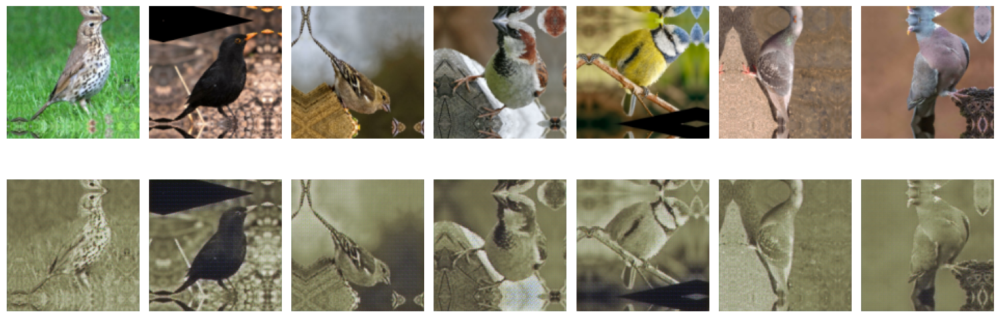

Epoch 10/400 - Generator Loss: 12.9009, Discriminator Loss: 1.3164, Discriminator Accuracy: 0.7101, Val MSE Score: 0.0489, Val MAE Score: 0.1684.
Epoch 11/400 - Generator Loss: 15.9971, Discriminator Loss: 6.8228, Discriminator Accuracy: 0.6028, Val MSE Score: 0.0432, Val MAE Score: 0.1456.
Epoch 12/400 - Generator Loss: 13.3997, Discriminator Loss: 1.4473, Discriminator Accuracy: 0.6402, Val MSE Score: 0.0304, Val MAE Score: 0.1207.
Epoch 13/400 - Generator Loss: 12.8302, Discriminator Loss: 1.3475, Discriminator Accuracy: 0.6776, Val MSE Score: 0.0371, Val MAE Score: 0.1416.
Epoch 14/400 - Generator Loss: 12.8015, Discriminator Loss: 1.3815, Discriminator Accuracy: 0.6752, Val MSE Score: 0.0295, Val MAE Score: 0.1173.
Epoch 15/400 - Generator Loss: 12.7105, Discriminator Loss: 1.3110, Discriminator Accuracy: 0.7215, Val MSE Score: 0.0555, Val MAE Score: 0.1543.
Epoch 16/400 - Generator Loss: 12.7013, Discriminator Loss: 1.3609, Discriminator Accuracy: 0.7286, Val MSE Score: 0.0286, V

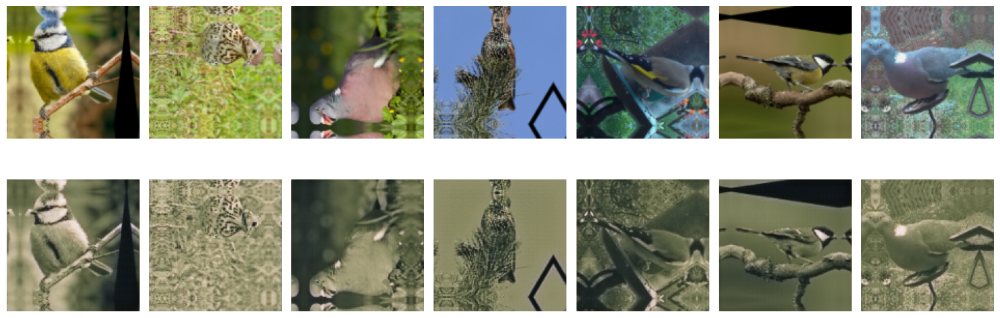

Epoch 20/400 - Generator Loss: 12.6785, Discriminator Loss: 1.2788, Discriminator Accuracy: 0.7530, Val MSE Score: 0.0311, Val MAE Score: 0.1242.
Epoch 21/400 - Generator Loss: 12.5979, Discriminator Loss: 1.2945, Discriminator Accuracy: 0.7242, Val MSE Score: 0.0292, Val MAE Score: 0.1148.
Epoch 22/400 - Generator Loss: 12.4828, Discriminator Loss: 1.2946, Discriminator Accuracy: 0.7404, Val MSE Score: 0.0298, Val MAE Score: 0.1160.
Epoch 23/400 - Generator Loss: 12.4297, Discriminator Loss: 1.2365, Discriminator Accuracy: 0.7787, Val MSE Score: 0.0310, Val MAE Score: 0.1211.
Epoch 24/400 - Generator Loss: 12.6213, Discriminator Loss: 1.2295, Discriminator Accuracy: 0.7870, Val MSE Score: 0.0277, Val MAE Score: 0.1111.
Epoch 25/400 - Generator Loss: 12.4101, Discriminator Loss: 1.3621, Discriminator Accuracy: 0.7349, Val MSE Score: 0.0275, Val MAE Score: 0.1106.
Epoch 26/400 - Generator Loss: 12.3059, Discriminator Loss: 1.2347, Discriminator Accuracy: 0.7653, Val MSE Score: 0.0274, V

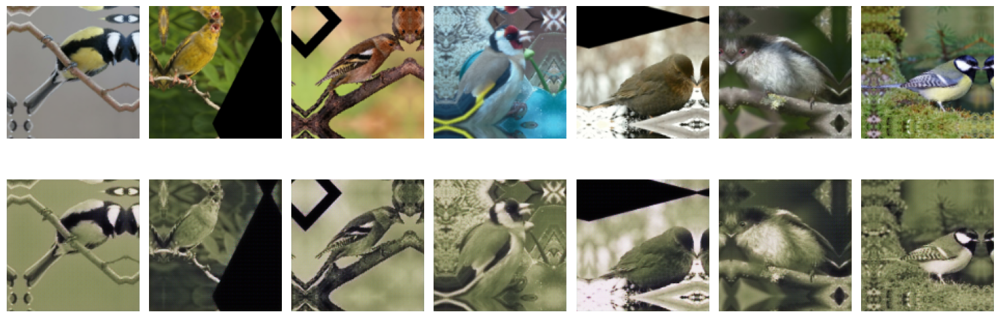

Epoch 30/400 - Generator Loss: 12.4936, Discriminator Loss: 1.2303, Discriminator Accuracy: 0.7839, Val MSE Score: 0.0279, Val MAE Score: 0.1109.
Epoch 31/400 - Generator Loss: 12.4273, Discriminator Loss: 1.2081, Discriminator Accuracy: 0.7989, Val MSE Score: 0.0275, Val MAE Score: 0.1108.
Epoch 32/400 - Generator Loss: 12.5535, Discriminator Loss: 1.2096, Discriminator Accuracy: 0.7879, Val MSE Score: 0.0269, Val MAE Score: 0.1083.
Epoch 33/400 - Generator Loss: 13.6255, Discriminator Loss: 2.1921, Discriminator Accuracy: 0.6654, Val MSE Score: 0.0278, Val MAE Score: 0.1131.
Epoch 34/400 - Generator Loss: 12.3667, Discriminator Loss: 1.3698, Discriminator Accuracy: 0.6706, Val MSE Score: 0.0285, Val MAE Score: 0.1139.
Epoch 35/400 - Generator Loss: 12.5023, Discriminator Loss: 1.3382, Discriminator Accuracy: 0.7175, Val MSE Score: 0.0274, Val MAE Score: 0.1089.
Epoch 36/400 - Generator Loss: 12.4988, Discriminator Loss: 1.3118, Discriminator Accuracy: 0.7434, Val MSE Score: 0.0281, V

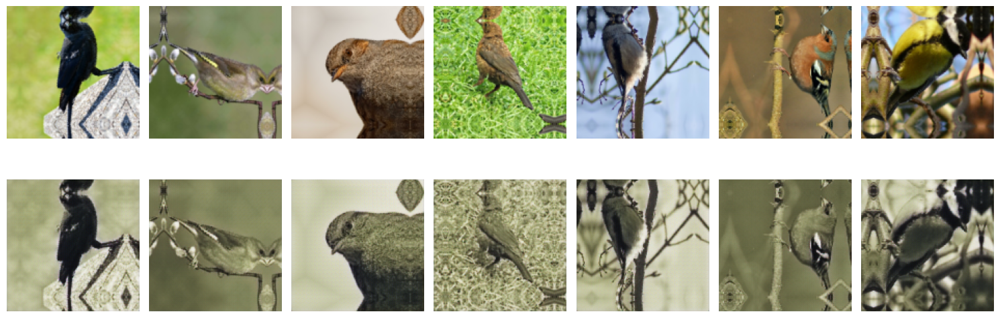

Epoch 40/400 - Generator Loss: 12.3353, Discriminator Loss: 1.2630, Discriminator Accuracy: 0.7745, Val MSE Score: 0.0284, Val MAE Score: 0.1125.
Epoch 41/400 - Generator Loss: 12.4446, Discriminator Loss: 1.2735, Discriminator Accuracy: 0.7663, Val MSE Score: 0.0268, Val MAE Score: 0.1084.
Epoch 42/400 - Generator Loss: 12.2843, Discriminator Loss: 1.2660, Discriminator Accuracy: 0.7511, Val MSE Score: 0.0264, Val MAE Score: 0.1056.


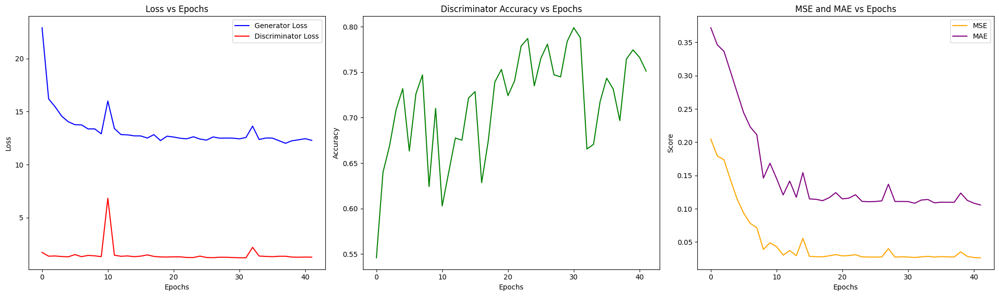

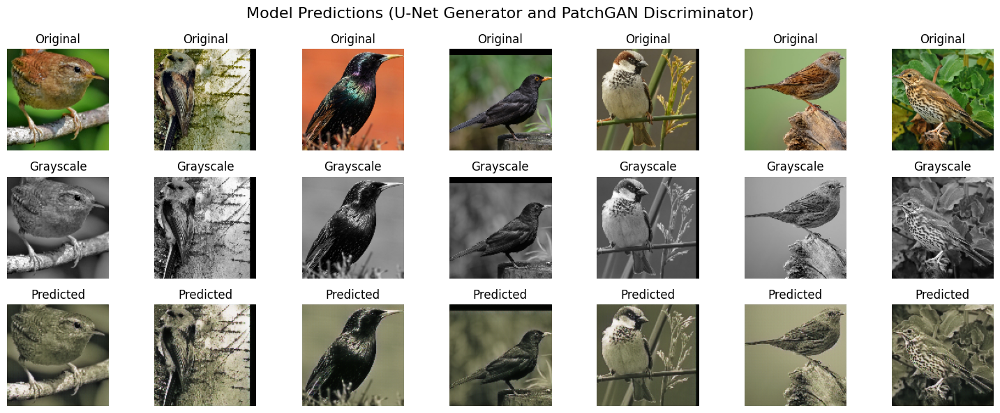

time: 15min 8s (started: 2025-03-20 19:07:05 +00:00)


In [ ]:
train_cgan(generator_3, discriminator_3,
           generator_optimizer_3, discriminator_optimizer_3,
           generator_bce_mae_loss, discriminator_loss)

generator_3.save('model_3_generator.keras')

visualize_predictions(generator_3, validation_dataset, title_suffix="(U-Net Generator and PatchGAN Discriminator)", final=True)

# Conclusions

### Compare the Models

Unlike the article, where they used U-Net and PatchGAN, our results showed that the second experiment, which did not use them, performed the best. Based on these results, we chose the second model as our best model.

### Evaluate the Best Model on the Test Set

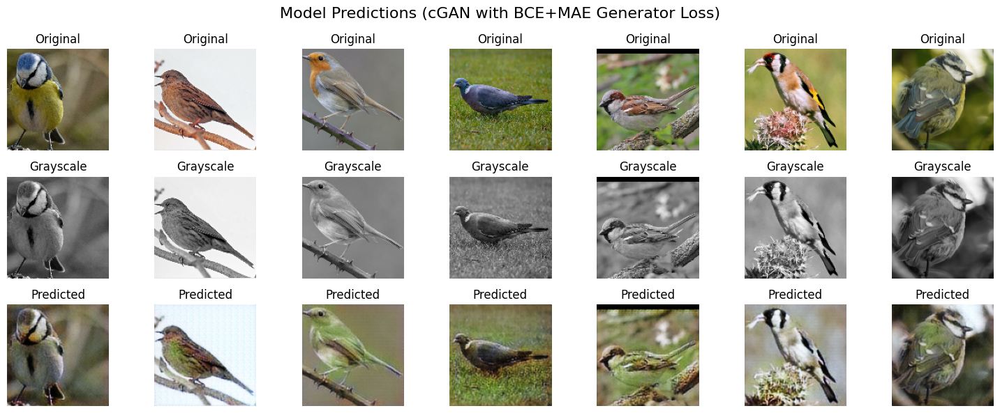


The model's MSE score is: 0.0447
The model's MAE score is: 0.1458
time: 1.81 s (started: 2025-03-20 19:24:07 +00:00)


In [ ]:
# Visualize predictions for the test set
visualize_predictions(generator_2, test_dataset, title_suffix="(cGAN with BCE+MAE Generator Loss)", final=True)

all_generated_images = []
all_real_images = []

# Iterate over the entire test set
for gray_images, real_images in test_dataset:
    generated_images = generator_2(gray_images, training=False)  # Generate images for the current batch
    all_generated_images.append(generated_images)
    all_real_images.append(real_images)

# Concatenate all generated and real images from the test set
all_generated_images = np.concatenate(all_generated_images, axis=0)
all_real_images = np.concatenate(all_real_images, axis=0)

# Calculate MSE (Mean Squared Error) between real and generated images
mse_score = np.mean(np.square(all_real_images - all_generated_images))

# Calculate MAE (Mean Absolute Error) between real and generated images
mae_score = np.mean(np.abs(all_real_images - all_generated_images))

# Print out the evaluation metrics
print(f"\nThe model's MSE score is: {mse_score:.4f}")
print(f"The model's MAE score is: {mae_score:.4f}")

### Final Thoughts

Throughout these experiments, we observed that, unlike the article, our second experiment performed the best, even without using U-Net and PatchGAN. This suggests that our approach was effective despite deviating from their recommendations.

This was our first experience building a generative model, and it was a fascinating learning process. Exploring different architectures and loss functions provided valuable insights, and we found the process of generating realistic outputs particularly interesting.